In [1]:
import pandas as pd

In [2]:
run1_testpreds = pd.read_csv("/data/bchen158/ML4GW/ML4GWsearch/src/results/train_20231023/222238/plots/test_metrics/filtered_data.txt")
print(run1_testpreds.shape)
run1_testpreds.head()

(11781, 5)


,id,label,prediction,prediction_proba_0,prediction_proba_1
0,d3f2689122,1,0,0.149791,-0.040726
1,c60d13040e,1,0,0.179459,-0.071089
2,5a271a4962,1,0,0.278948,-0.111455
3,c2296c1687,1,0,0.111374,0.065540
4,062545a8a4,1,0,0.443466,-0.312689


In [3]:
run2_testpreds = pd.read_csv("/data/bchen158/ML4GW/ML4GWsearch/src/results/train_20231024/141852/plots/test_metrics/filtered_data.txt")
print(run2_testpreds.shape)
run2_testpreds.head()

(11929, 5)


,id,label,prediction,prediction_proba_0,prediction_proba_1
0,d3f2689122,1,0,0.161133,-0.165396
1,c60d13040e,1,0,0.080026,-0.013223
2,5a271a4962,1,0,0.329629,-0.244355
3,c2296c1687,1,0,0.077387,0.051582
4,062545a8a4,1,0,0.284812,-0.273097


In [4]:
fn_run1_testpreds = run1_testpreds[(run1_testpreds['label']==1) & (run1_testpreds['prediction']==0)]
fn_run2_testpreds = run2_testpreds[(run2_testpreds['label']==1) & (run2_testpreds['prediction']==0)]

print(fn_run1_testpreds.shape) 
print(fn_run2_testpreds.shape)

common_fn = pd.merge(fn_run1_testpreds, fn_run2_testpreds, how='inner', on=['id'])
common_fn.shape

(11781, 5)
(11929, 5)


(10926, 9)

In [5]:
fn_exists_in_run1_not_in_run2 = fn_run1_testpreds[~fn_run1_testpreds['id'].isin(common_fn['id'])]
print(fn_exists_in_run1_not_in_run2.shape)

fn_exists_in_run2_not_in_run1 = fn_run2_testpreds[~fn_run2_testpreds['id'].isin(common_fn['id'])]
print(fn_exists_in_run2_not_in_run1.shape)

fn_exists_in_run1_not_in_run2.head()

(855, 5)
(1003, 5)


,id,label,prediction,prediction_proba_0,prediction_proba_1
20,4eb624abfa,1,0,0.032468,-0.082281
21,fdc083ed85,1,0,0.072297,0.057526
23,8357b4c0f0,1,0,0.092601,0.008456
46,90bd269e79,1,0,0.203452,-0.020850
50,13b67fbfde,1,0,0.103796,0.059815


In [6]:
import numpy as np

# Assuming that fn_run1_testpreds and fn_run2_testpreds are the two dataframes containing the test predictions from Run 1 and Run 2, respectively
# common_fn is a dataframe containing the common ids between the two runs

# Function to randomly select samples from the given dataframe
def random_sample(dataframe, num_samples):
   return dataframe.sample(n=num_samples, random_state=42)

# Randomly selecting 10 samples from fn_exists_in_run1_not_in_run2
num_samples = 10
fn_exists_in_run1_not_in_run2_random = random_sample(fn_exists_in_run1_not_in_run2, num_samples)
print(fn_exists_in_run1_not_in_run2_random.shape)

# Randomly selecting 10 samples from fn_exists_in_run2_not_in_run1
fn_exists_in_run2_not_in_run1_random = random_sample(fn_exists_in_run2_not_in_run1, num_samples)
print(fn_exists_in_run2_not_in_run1_random.shape)

fn_exists_in_run1_not_in_run2_random.head()
fn_exists_in_run2_not_in_run1_random.head()

(10, 5)
(10, 5)


,id,label,prediction,prediction_proba_0,prediction_proba_1
7426,d161751054,1,0,0.200924,-0.081433
7438,faaed48f7d,1,0,0.113564,0.088169
10006,4ee459a669,1,0,0.078147,-0.089374
6081,cc0581b729,1,0,0.152523,-0.063986
4319,349ee4116b,1,0,0.052329,-0.050098


#####################################################################
## Randomly select False Negative samples in run1 but not in run2 ##
#####################################################################
794      b147f48068
6132     ed5a15cc24
2628     9f4cb82371
2801     9ce4bac739
10958    c0fa9199a2
Name: id, dtype: object
#####################################################################
## Randomly select False Negative samples in run2 but not in run1 ##
#####################################################################
7426     d161751054
7438     faaed48f7d
10006    4ee459a669
6081     cc0581b729
4319     349ee4116b
Name: id, dtype: object


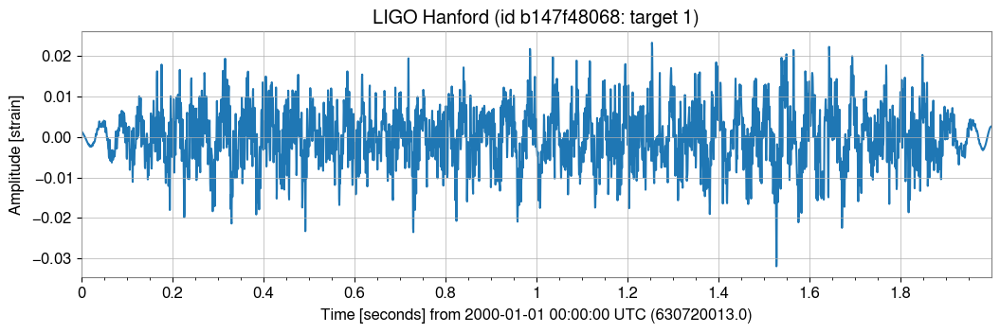

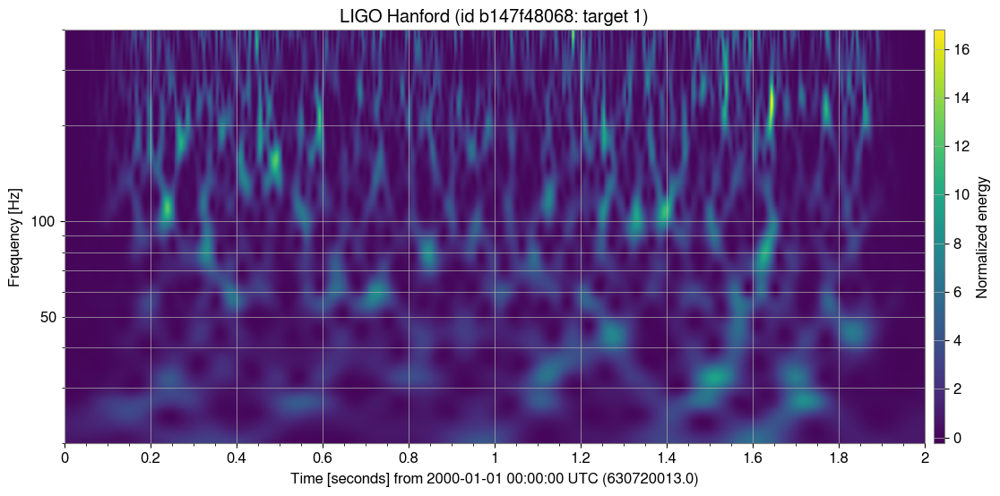

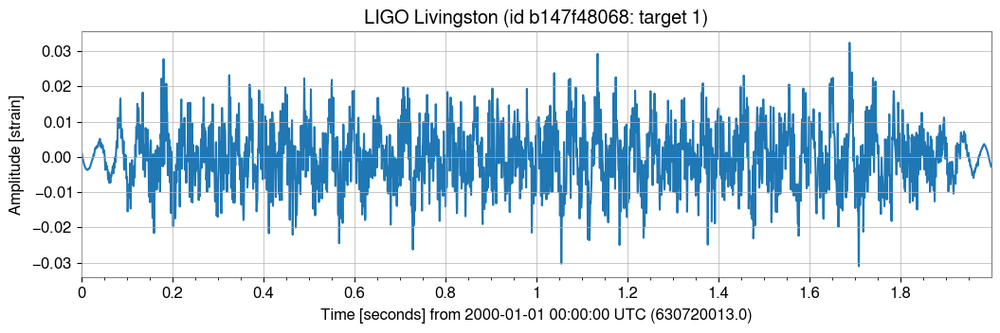

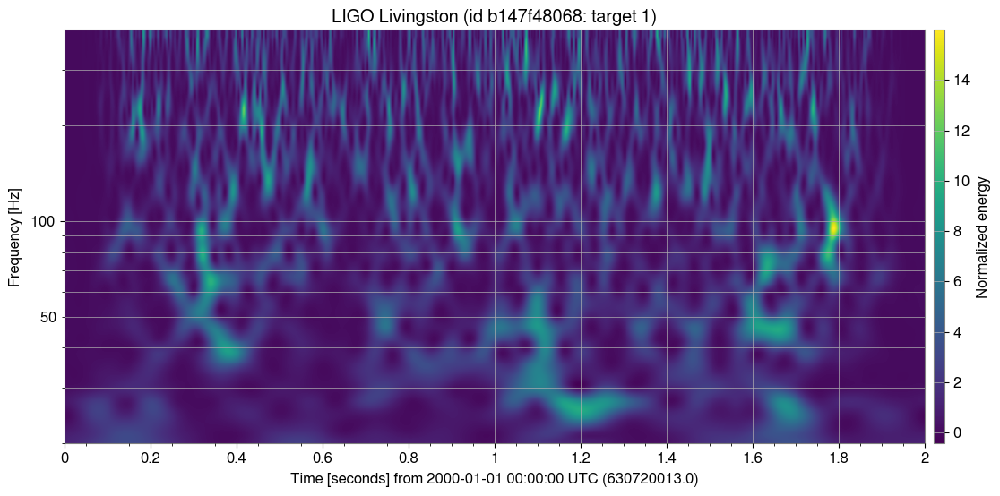

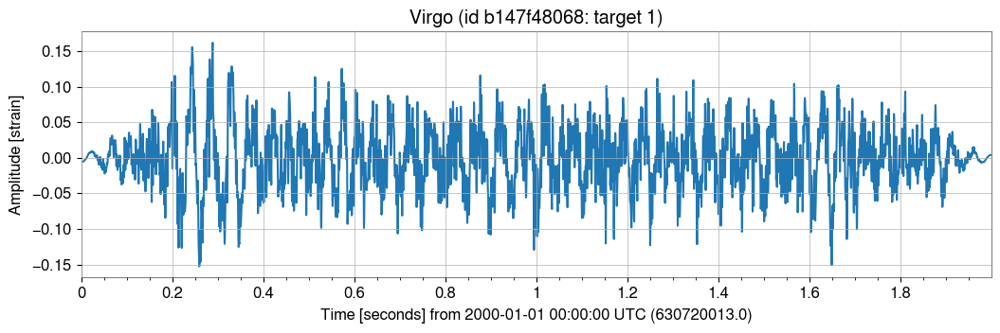

...

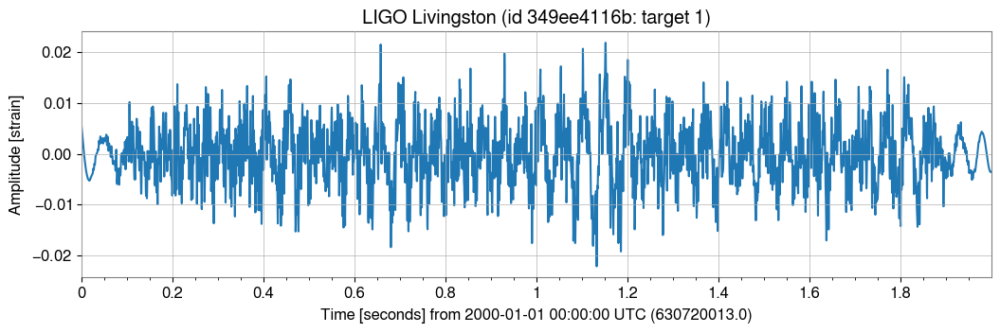

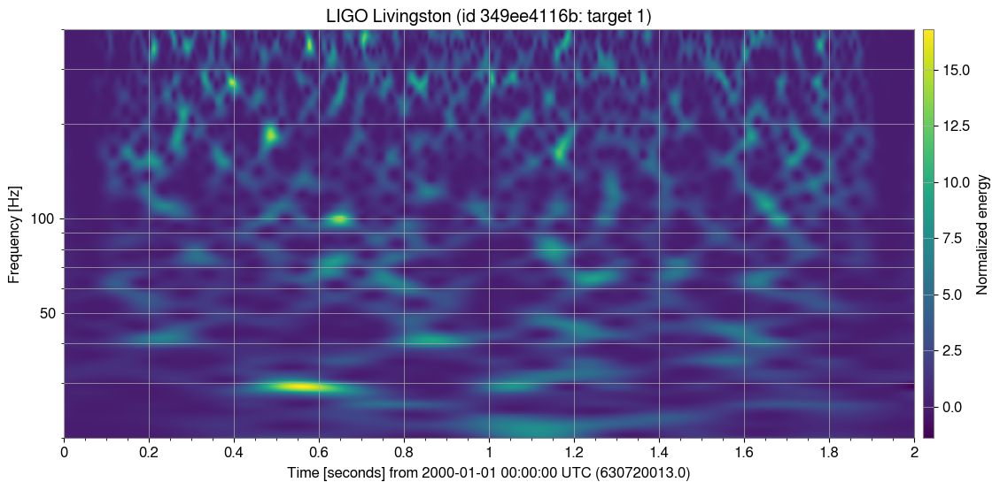

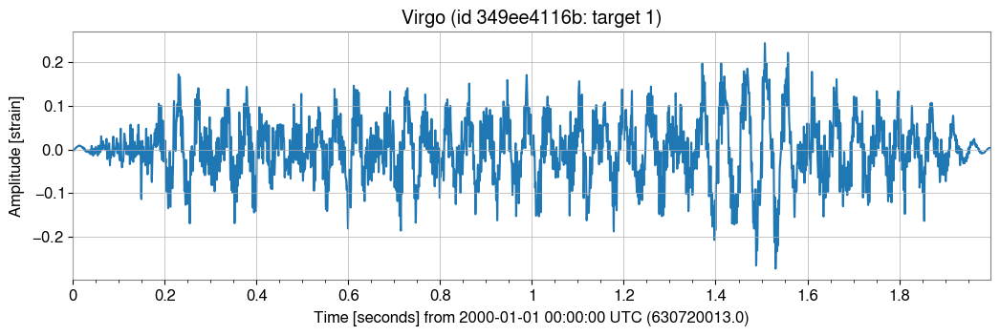

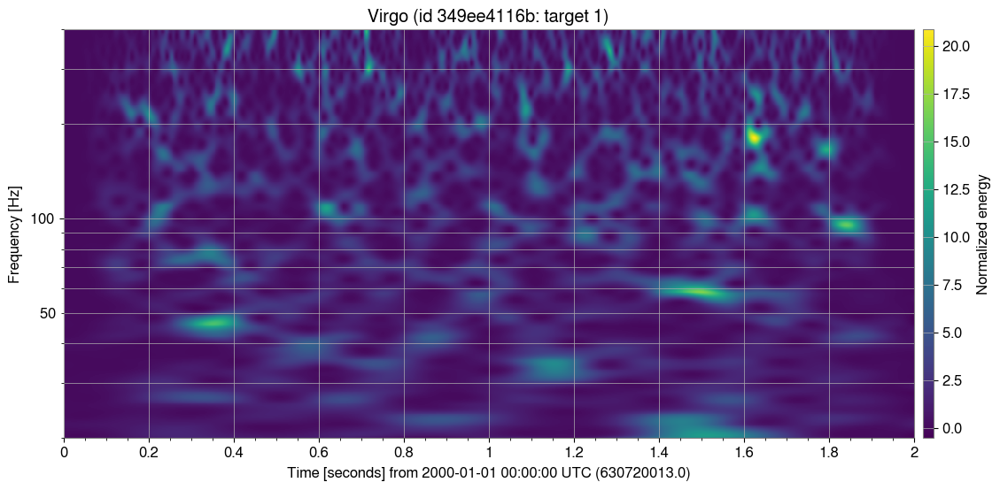

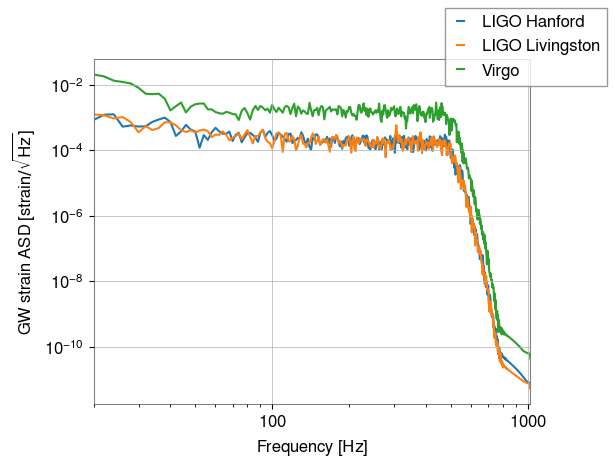

In [7]:
import utils
# sample_size = 1
highpass = False
z_norm = False
whiten = False
bandpass=True
scale=True

print("#####################################################################")
print("## Randomly select False Negative samples in run1 but not in run2 ##")
print("#####################################################################")
# _id = 'd3f2689122'
# Select the first id from the randomly selected samples in run1
_ids_run1 = fn_exists_in_run1_not_in_run2_random['id'].iloc[:5]
print(_ids_run1)
for _id in _ids_run1:
    utils.plot_sample_ts(_id=_id, target=1, highpass=highpass, bandpass=bandpass, scale=scale, z_norm=z_norm, ts_whiten=whiten)

print("#####################################################################")
print("## Randomly select False Negative samples in run2 but not in run1 ##")
print("#####################################################################")

# Select the first id from the randomly selected samples in run2
_ids_run2 = fn_exists_in_run2_not_in_run1_random['id'].iloc[:5]
print(_ids_run2)
for _id in _ids_run2:
    utils.plot_sample_ts(_id=_id, target=1, highpass=highpass, bandpass=bandpass, scale=scale, z_norm=z_norm, ts_whiten=whiten)